#Worksheet: Pure Pursuit Path Tracking with PID Speed Control

Objective:
Implement a pure pursuit-based steering controller along with a PID (proportional) speed controller to simulate a vehicle tracking a 2D path

In [27]:
import numpy as np
import math
import matplotlib.pyplot as plt

In [28]:
# === Angle Modulo Utility ===
def angle_mod(x, zero_2_2pi=False, degree=False):
    """
    Return angle modulo [-pi, pi) or [0, 2pi)
    This is useful when working with angles to keep them in standard ranges.
    """
    # Implement the angle wrapping logic
    if degree:
        x = x % 360
        if not zero_2_2pi:
            if x >= 180:
                x -= 360
    else:
        x = x % (2 * math.pi)
        if not zero_2_2pi:
            if x >= math.pi:
                x -= 2 * math.pi
    return x

In [29]:
# === Tuning Parameters (Choose appropriate values) ===
k = 0.1       # Look forward gain for pure pursuit (Use an adaptive lookahead = Lfc + velocity*k)
Lfc = 2.0     # Look-ahead distance [m]
Kp = 1.0      # Proportional gain for speed control
dt = 0.1      # Time step [s]
WB = 2.9      # Wheelbase of vehicle [m]

In [30]:
# Vehicle geometry for visualization (fixed)
LENGTH = WB + 1.0
WIDTH = 2.0
WHEEL_LEN = 0.6
WHEEL_WIDTH = 0.2
MAX_STEER = math.pi / 4  # Max steering angle in radians

In [31]:
# === State of Vehicle ===
class State:
    """
    Represents the state of the vehicle including position, heading, and velocity.
    Implement the update method using bicycle kinematics.
    """
    def __init__(self, x=0.0, y=0.0, yaw=0.0, v=0.0):
        self.x = x
        self.y = y
        self.yaw = yaw
        self.v = v
        self.rear_x = self.x - (WB / 2) * math.cos(self.yaw)
        self.rear_y = self.y - (WB / 2) * math.sin(self.yaw)

    def update(self, a, delta):
        """
        Update the vehicle state given acceleration `a` and steering angle `delta`.
        """
        # Implement bicycle model here
        delta = max(-MAX_STEER, min(MAX_STEER, delta))  # Limit steering angle
        self.v += a * dt
        self.v = max(0.0, self.v)  # Prevent negative velocity
        self.x += self.v * math.cos(self.yaw) * dt
        self.y += self.v * math.sin(self.yaw) * dt
        self.yaw += (self.v * math.tan(delta) * dt) / WB
        self.yaw = angle_mod(self.yaw)  # Normalize angle
        self.rear_x = self.x - (WB / 2) * math.cos(self.yaw)
        self.rear_y = self.y - (WB / 2) * math.sin(self.yaw)

    def calc_distance(self, point_x, point_y):
        """
        Compute distance from rear axle to a given (point_x, point_y).
        """
        dx = self.rear_x - point_x
        dy = self.rear_y - point_y
        return math.hypot(dx, dy)

In [32]:
# === State Recorder for Visualization ===
class States:
    """
    Keeps track of vehicle states over time for plotting.
    """
    def __init__(self):
        self.x = []
        self.y = []
        self.yaw = []
        self.v = []
        self.t = []

    def append(self, t, state):
        self.x.append(state.x)
        self.y.append(state.y)
        self.yaw.append(state.yaw)
        self.v.append(state.v)
        self.t.append(t)

In [33]:
# === PID Speed Controller ===
def proportional_control(target, current):
    """
    Compute acceleration using a proportional controller.
    """
    # Implement a simple P controller which outputs the acceleration
    error = target - current
    acceleration = Kp * error
    return acceleration

In [34]:
# === Pure Pursuit Target Finder ===
class TargetCourse:
    """
    Maintains the reference path and provides the next look-ahead point for pure pursuit.
    """
    def __init__(self, cx, cy):
        self.cx = cx
        self.cy = cy
        self.old_nearest_point_index = None

    def search_target_index(self, state):
        """
        Search the next target point on the path based on current vehicle state.
        """
        # Implement nearest point search followed by look-ahead index search
        if self.old_nearest_point_index is None:
            distances = [math.hypot(state.rear_x - self.cx[i], state.rear_y - self.cy[i]) for i in range(len(self.cx))]
            self.old_nearest_point_index = distances.index(min(distances))
        else:
            # Search around the previous nearest point for efficiency
            while self.old_nearest_point_index < len(self.cx) - 1:
                d1 = math.hypot(state.rear_x - self.cx[self.old_nearest_point_index], 
                               state.rear_y - self.cy[self.old_nearest_point_index])
                d2 = math.hypot(state.rear_x - self.cx[self.old_nearest_point_index + 1], 
                               state.rear_y - self.cy[self.old_nearest_point_index + 1])
                if d1 <= d2:
                    break
                self.old_nearest_point_index += 1
        
        Lf = k * state.v + Lfc
        
        # Search forward from the nearest point for the lookahead target
        for i in range(self.old_nearest_point_index, len(self.cx)):
            distance = math.hypot(state.rear_x - self.cx[i], state.rear_y - self.cy[i])
            if distance >= Lf:
                return i
        
        # If no point found, return the last point
        return len(self.cx) - 1

In [35]:
# === Pure Pursuit Steering Control ===
def pure_pursuit_steer_control(state, trajectory, prevind): #Use prevind to ensure forward motion
    """
    Compute the steering angle using pure pursuit logic.
    """
    # Use the look-ahead point to compute the steering angle
    target_ind = trajectory.search_target_index(state)
    
    if target_ind < prevind:
        target_ind = prevind
    
    dx = trajectory.cx[target_ind] - state.x
    dy = trajectory.cy[target_ind] - state.y
    angle_to_target = math.atan2(dy, dx)
    alpha = angle_mod(angle_to_target - state.yaw)

    Lf = k * state.v + Lfc
    delta = math.atan2(2.0*WB*math.sin(alpha), Lf)
    return delta, target_ind

In [36]:
# === Visualization Utilities ===
def plot_arrow(x, y, yaw, length=1.0, width=0.5, fc="r", ec="k"):
    """
    Plot a direction arrow for vehicle heading.
    """
    plt.arrow(x, y, length * np.cos(yaw), length * np.sin(yaw),
              head_width=width, head_length=0.3, fc=fc, ec=ec)

In [37]:
def plot_vehicle(x, y, yaw, steer=0.0, color='blue'):
    """
    Draw the vehicle as a rectangle with wheels and a direction arrow.
    """
    def plot_wheel(wheel_x, wheel_y, wheel_yaw, steer=0.0, color=color):
        wheel = np.array([
            [-WHEEL_LEN/2, WHEEL_WIDTH/2],
            [WHEEL_LEN/2, WHEEL_WIDTH/2],
            [WHEEL_LEN/2, -WHEEL_WIDTH/2],
            [-WHEEL_LEN/2, -WHEEL_WIDTH/2],
            [-WHEEL_LEN/2, WHEEL_WIDTH/2]
        ])

        # Rotate wheel for steering
        if steer != 0:
            c, s = np.cos(steer), np.sin(steer)
            rot_steer = np.array([[c, -s], [s, c]])
            wheel = wheel @ rot_steer.T

        # Rotate to vehicle orientation
        c, s = np.cos(wheel_yaw), np.sin(wheel_yaw)
        rot_yaw = np.array([[c, -s], [s, c]])
        wheel = wheel @ rot_yaw.T

        # Translate to wheel position
        wheel[:, 0] += wheel_x
        wheel[:, 1] += wheel_y

        # Draw wheel
        plt.plot(wheel[:, 0], wheel[:, 1], color=color)

    # Vehicle body corners
    corners = np.array([
        [-LENGTH/2, WIDTH/2],
        [LENGTH/2, WIDTH/2],
        [LENGTH/2, -WIDTH/2],
        [-LENGTH/2, -WIDTH/2],
        [-LENGTH/2, WIDTH/2]
    ])

    c, s = np.cos(yaw), np.sin(yaw)
    rot = np.array([[c, -s], [s, c]])
    body = corners @ rot.T
    body[:, 0] += x
    body[:, 1] += y
    plt.plot(body[:, 0], body[:, 1], color=color)

    # Wheel positions (relative)
    front_x_offset = LENGTH / 4
    rear_x_offset = -LENGTH / 4
    half_width = WIDTH / 2

    # Front wheels
    plot_wheel(x + front_x_offset * c - half_width * s, y + front_x_offset * s + half_width * c, yaw, steer, 'black')
    plot_wheel(x + front_x_offset * c + half_width * s, y + front_x_offset * s - half_width * c, yaw, steer, 'black')

    # Rear wheels
    plot_wheel(x + rear_x_offset * c - half_width * s, y + rear_x_offset * s + half_width * c, yaw, 0.0, 'black')
    plot_wheel(x + rear_x_offset * c + half_width * s, y + rear_x_offset * s - half_width * c, yaw, 0.0, 'black')

    # Direction arrow
    arrow_length = LENGTH / 2
    plt.arrow(x, y, arrow_length * np.cos(yaw), arrow_length * np.sin(yaw),
              head_width=0.3, head_length=0.4, fc='r', ec='r')

In [38]:
# === Simulation Part ===
def main():
    # Define a path for the vehicle to follow
    # Start with a straight line or sinusoidal path for testing
    # Once working, use the following predefined path:

    cx = np.arange(0, 50, 0.5)
    cy = [math.sin(ix / 5.0) * ix / 2.0 for ix in cx]

    target_speed = 10.0 / 3.6  # [m/s]
    T = 100.0                  # Total time

    state = State(x=0.0, y=-3.0, yaw=0.0, v=0.0)

    lastIndex = len(cx) - 1
    time = 0.0
    states = States()
    states.append(time, state)

    target_course = TargetCourse(cx, cy)
    target_ind = target_course.search_target_index(state)

    while T >= time and lastIndex > target_ind:

        # --- Compute control inputs here ---
        ai = proportional_control(target_speed, state.v)
        di, target_ind = pure_pursuit_steer_control(state, target_course, target_ind)

        state.update(ai, di)
        time += dt
        states.append(time, state)

        # --- Visualization ---
        plt.cla()
        plot_vehicle(state.x, state.y, state.yaw, di)
        plt.plot(cx, cy, "-r", label="Course")
        plt.plot(states.x, states.y, "-b", label="Trajectory")
        plt.plot(cx[target_ind], cy[target_ind], "xg", label="Target")
        plt.axis("equal")
        plt.grid(True)
        plt.title("Speed [km/h]: {:.2f}".format(state.v * 3.6))
        plt.legend()
        plt.pause(0.001)

    assert lastIndex >= target_ind, "Did not reach goal!"

    # Final results
    plt.cla()
    plt.plot(cx, cy, ".r", label="Course")
    plt.plot(states.x, states.y, "-b", label="Trajectory")
    plt.legend()
    plt.xlabel("x [m]")
    plt.ylabel("y [m]")
    plt.axis("equal")
    plt.grid(True)
    plt.savefig("trajectory.png")

    plt.figure()
    plt.plot(states.t, [v * 3.6 for v in states.v], "-r")
    plt.xlabel("Time [s]")
    plt.ylabel("Speed [km/h]")
    plt.grid(True)
    plt.savefig("speed.png")
    plt.show()

=== Pure Pursuit + PID Speed Control Simulation ===


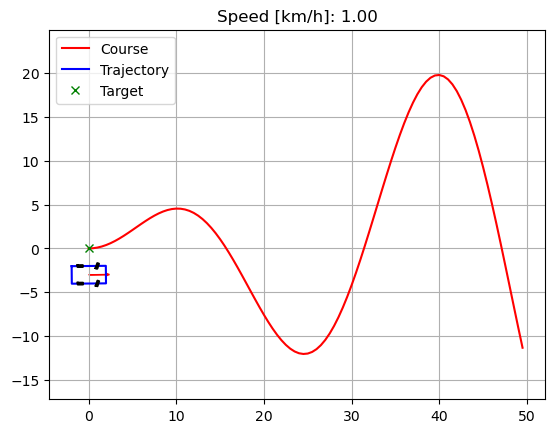

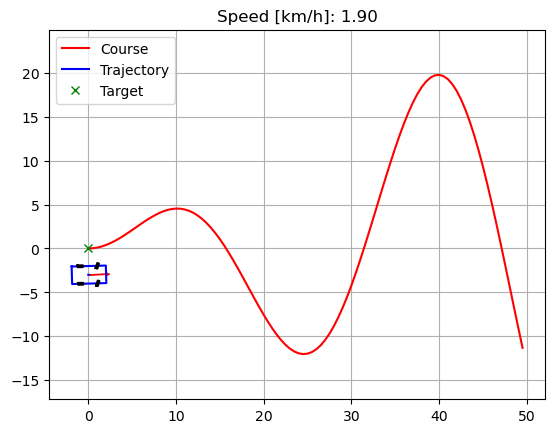

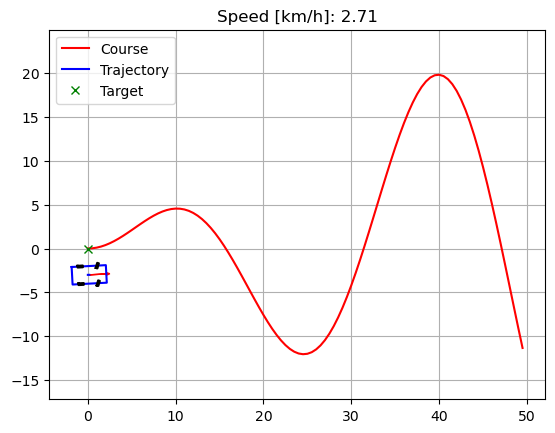

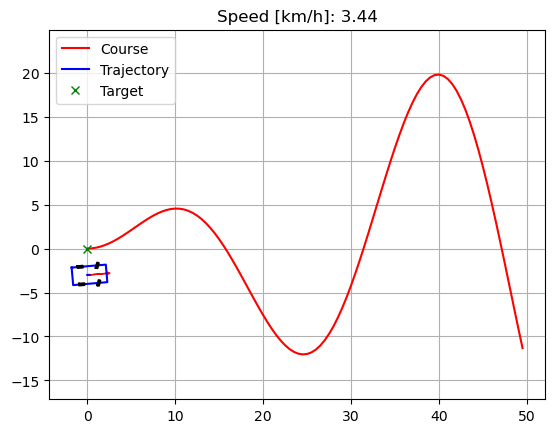

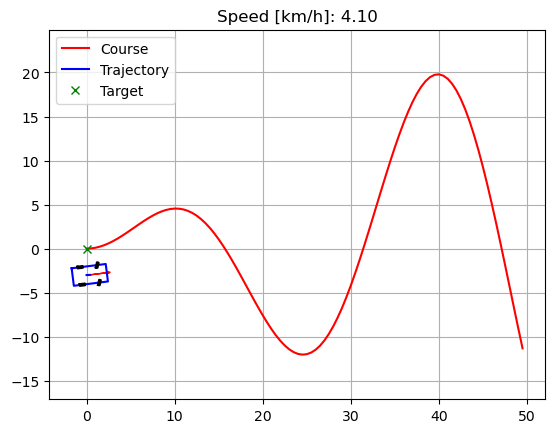

...

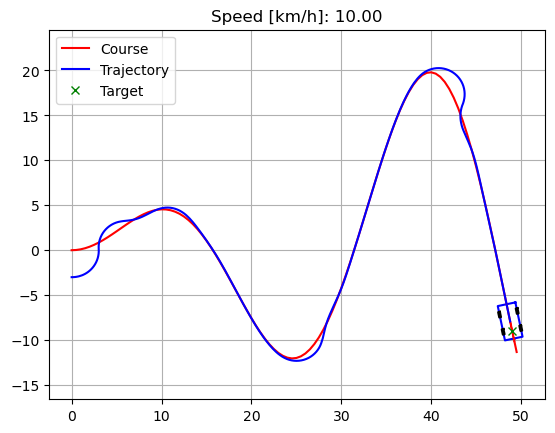

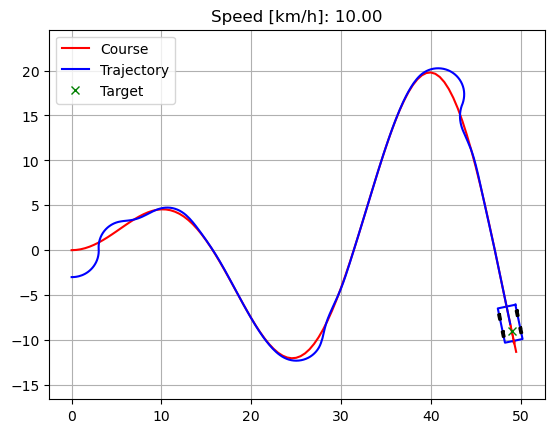

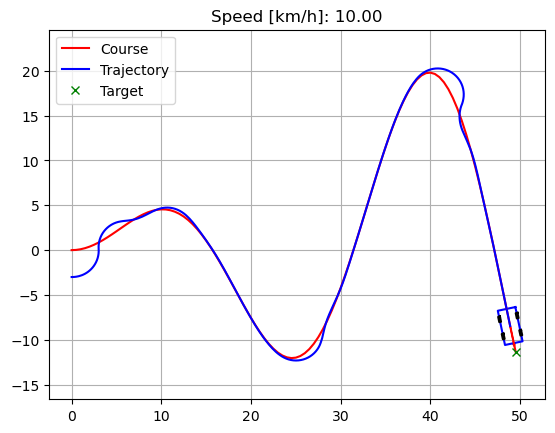

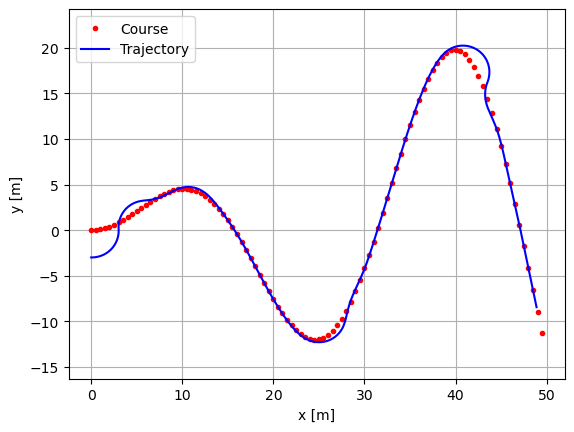

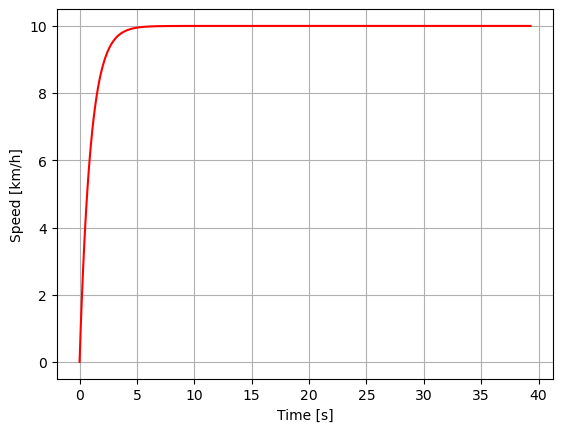

In [39]:
if __name__ == '__main__':
    print("=== Pure Pursuit + PID Speed Control Simulation ===")
    main()